# Using the Data Imputator on a Real Public Dataset, Herold et al. (2020)

In this example, we will be using the GP imputator on a dataset available at [Herold et al., 2020](https://doi.org/10.1038/s41467-020-19006-2) to imputate missing data. Then, we are going to use the VAR inference method to infer the causal relationships between the variables in the time series. 

First, we will import the neccessary libraries and load the dataset.

In [2]:
import matplotlib.pyplot as plt
import numpy as np


import pandas as pd
import seaborn as sns


from mimic.data_imputation.impute_GP import GPImputer
from mimic.model_infer.infer_VAR_bayes import *

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [2]:
data = pd.read_csv(r'Source Data/fig3ab.tsv', delimiter='\t')

data.head(15)

,genus,date,val,type
0,Acidimicrobium,2011-03-21,8.322484,MG
1,Acidimicrobium,2011-03-29,7.664534,MG
2,Acidimicrobium,2011-04-05,7.871188,MG
3,Acidimicrobium,2011-04-14,6.695900,MG
4,Acidimicrobium,2011-04-21,6.695177,MG
5,Acidimicrobium,2011-04-29,6.304652,MG
6,Acidimicrobium,2011-05-06,7.462918,MG
7,Acidimicrobium,2011-05-13,7.742366,MG
8,Acidimicrobium,2011-05-20,6.627358,MG
9,Acidimicrobium,2011-05-27,7.425880,MG


# Separate the data into MG and MT datasets

The data is separated into two datasets, MG and MT. The MG dataset contains the meta-genomics data, while the MT dataset contains the meta-transcriptomics. We will be using the MG dataset in this example.


In [ ]:
# separate the data into MG and MT datasets

dataMG = data[data['type'] == 'MG']

dataMG.info()

dataMT = data[data['type'] == 'MT']

dataMT.info()

We will proceed with some data wrangling to prepare the data for the imputation process.

In [ ]:
# Data cleaning
# Rename Nan in the genus column to 'Other'

dataMG['genus'] = dataMG['genus'].replace(np.nan, 'Other')

# Drop the 'type' column
dataMG = dataMG.drop(columns=['type'])

# Change relative Date columns to days
dataMG['date'] = pd.to_datetime(dataMG['date'])
dataMG['date'] = (dataMG['date'] - dataMG['date'].min()).dt.days

# Change the 'genus' column to a categorical column
dataMG['genus'] = dataMG['genus'].astype('category')


dataMG.info()

In [ ]:
# Plot the data, relative abundance (value) vs. days (date) for each genus


sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='val', hue='genus', data=dataMG)
plt.title('Microbial Growth Data')
plt.xlabel('Days')
plt.ylabel('Relative Abundance')
plt.show()

In [ ]:
# Pivot the data so each 'genus' is a column
dataMG_pivot = dataMG.pivot(
    index='date', columns='genus', values='val').fillna(0)

# Create a stacked area chart
plt.figure(figsize=(12, 6))
plt.stackplot(dataMG_pivot.index, dataMG_pivot.T, labels=dataMG_pivot.columns)

plt.title('Microbial Growth Data')
plt.xlabel('Days')
plt.ylabel('Relative Abundance')
plt.legend(loc='upper left')

plt.show()

In [ ]:
# Do the same data cleaning for the MT data set

# Rename Nan in the genus column to 'Other'

dataMT['genus'] = dataMT['genus'].replace(np.nan, 'Other')

# Drop the 'type' column
dataMT = dataMT.drop(columns=['type'])

# Change relative Date columns to days
dataMT['date'] = pd.to_datetime(dataMT['date'])
dataMT['date'] = (dataMT['date'] - dataMT['date'].min()).dt.days

# Change the 'genus' column to a categorical column
dataMT['genus'] = dataMT['genus'].astype('category')

In [ ]:
# Plot the data, relative abundance (value) vs. days (date) for each genus


sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='val', hue='genus', data=dataMT)
plt.title('Microbial Meta Transcriptomics Data')
plt.xlabel('Days')

In [ ]:
# Pivot the data so each 'genus' is a column
dataMT_pivot = dataMT.pivot(
    index='date', columns='genus', values='val').fillna(0)

# Pivot the MG data so each 'genus' is a column
dataMG_pivot = dataMG.pivot(
    index='date', columns='genus', values='val').fillna(0)

In [ ]:
metabolites = pd.read_csv(r'Source Data/fig4.tsv', delimiter='\t')

This dataset contains several columns, each representing different attributes related to microbial activity and metabolite concentrations. Here is a detailed explanation of each column:

- **date**: The date when the sample was collected.
- **L1**: The functional category or pathway associated with the data point.
- **mp_tot**: Total metaproteomic count for that date and pathway.
- **mt_tot**: Total metatranscriptomic count for that date and pathway.
- **L1sum_MP**: Sum of metaproteomic counts for that specific functional category (L1).
- **L1sum_MT**: Sum of metatranscriptomic counts for that specific functional category (L1).
- **L1rel_MP**: Relative abundance of metaproteomic counts within the functional category.
- **L1rel_MT**: Relative abundance of metatranscriptomic counts within the functional category.
- **MP_std_L1**: Standard deviation of metaproteomic counts for that functional category.
- **MT_std_L1**: Standard deviation of metatranscriptomic counts for that functional category.
- **cor**: Correlation value between metaproteomic and metatranscriptomic data for that pathway.
- **newL1**: A reformatted version of the functional category name, often including a correlation coefficient (r value) for easier readability in the figure.

We will be using the `L1rel_MP` and `L1rel_MT` columns in this example to use it with the VAR inference method to infer the causal relationships between the variables in the time series with the meta transcriptomics (MT) and meta genomics (MG) data.

In [ ]:
# Letr's create 2 dataframes, one for the L1rel_MP and the other for the L1rel_MT data, using the date, L1 and L2tel values

dataL1_MP = metabolites[['date', 'L1', 'L1rel_MP']]

dataL1_MT = metabolites[['date', 'L1', 'L1rel_MT']]
dataL1_MP.head(15)

In [ ]:
# Now let's visualize the data

sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='L1rel_MP', hue='L1', data=dataL1_MP)
plt.title('Metaproteomic Data')
plt.xlabel('Days')
plt.ylabel('Relative Abundance')
plt.show()

In [ ]:
# Same for the metatranscriptomic data

sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='L1rel_MT', hue='L1', data=dataL1_MT)
plt.title('Metatranscriptomic Data')
plt.xlabel('Days')
plt.ylabel('Relative Abundance')
plt.show()

In [ ]:
# And do the same as we did for the MG and MT data sets

# Rename Nan in the L1 column to 'Other'

dataL1_MP['L1'] = dataL1_MP['L1'].replace(np.nan, 'Other')

# Change relative Date columns to days
dataL1_MP['date'] = pd.to_datetime(dataL1_MP['date'])
dataL1_MP['date'] = (dataL1_MP['date'] - dataL1_MP['date'].min()).dt.days

# Change the 'L1' column to a categorical column
dataL1_MP['L1'] = dataL1_MP['L1'].astype('category')

In [ ]:
# do the same for the L1rel_MT data set

# Rename Nan in the L1 column to 'Other'

dataL1_MT['L1'] = dataL1_MT['L1'].replace(np.nan, 'Other')

# Change relative Date columns to days
dataL1_MT['date'] = pd.to_datetime(dataL1_MT['date'])
dataL1_MT['date'] = (dataL1_MT['date'] - dataL1_MT['date'].min()).dt.days

# Change the 'L1' column to a categorical column
dataL1_MT['L1'] = dataL1_MT['L1'].astype('category')

# Plot the data, relative abundance (value) vs. days (date) for each L1


sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='L1rel_MP', hue='L1', data=dataL1_MP)
plt.title('Metaproteomic Data')
plt.xlabel('Days')
plt.ylabel('Relative Abundance')
plt.show()

In [ ]:
# And now pivot the data so each 'L1' is a column for each data set

dataL1_MP_pivot = dataL1_MP.pivot(
    index='date', columns='L1', values='L1rel_MP').fillna(0)

dataL1_MT_pivot = dataL1_MT.pivot(
    index='date', columns='L1', values='L1rel_MT').fillna(0)

In [ ]:
# Now let's try to infer the var model for both the L1rel_MP or L1rel_MT data sets with the MG or MT data sets
# So we will have 4 combinations to try
# 1. L1rel_MP with MG
# 2. L1rel_MP with MT
# 3. L1rel_MT with MG
# 4. L1rel_MT with MT

infer12 = infer_VAR(data=dataMG_pivot, dataS=dataL1_MP_pivot)

infer12.run_inference_xs()

In [ ]:
infer12.posterior_analysis()

In [ ]:
infer13 = infer_VAR(data=dataMT_pivot, dataS=dataL1_MP_pivot)

infer13.run_inference_xs()

In [ ]:
infer13.posterior_analysis()

In [ ]:
infer14 = infer_VAR(data=dataMG_pivot, dataS=dataL1_MT_pivot)

infer14.run_inference_xs()

In [ ]:
infer14.posterior_analysis()

In [ ]:
infer15 = infer_VAR(data=dataMT_pivot, dataS=dataL1_MT_pivot)

infer15.run_inference_xs()

In [ ]:
infer15.posterior_analysis()

In [ ]:
dataL1_MP_pivot.head(15)

In [ ]:
print(dataL1_MP_pivot.index)

In [ ]:
# Step 1: Determine the minimum and maximum index
min_index = dataL1_MP_pivot.index.min()
max_index = dataL1_MP_pivot.index.max()

# Step 2: Create a new index range from min_index to max_index
new_index = range(int(min_index), int(max_index) +
                  1)  # Ensure it's an integer range

# Step 3: Re-index the DataFrame
dataL1_MP_complete = dataL1_MP_pivot.reindex(new_index)

dataL1_MP_complete.head(15)

In [ ]:
# Reset the index
complete_dataMP_reset = dataL1_MP_complete.reset_index()

# Make index as float
complete_dataMP_reset['date'] = complete_dataMP_reset['date'].astype(float)

In [ ]:
complete_dataMP_reset.head(15)

In [ ]:
# do the imputation for each column (metabolite) in the dataset
# Copy the original dataset
new_dataset_complete = complete_dataMP_reset.copy()

for metabolite in dataL1_MP_complete.columns:
    # Impute the missing values for the current column
    imputed_data = GPImputer().impute_missing_values(
        complete_dataMP_reset, ['date'], [metabolite], metabolite
    )

    # Update the column in the new dataset with the imputed data
    new_dataset_complete[metabolite] = imputed_data[metabolite]

# Save the dataset (new_dataset_complete) to a csv file
new_dataset_complete.to_csv('MP_metabolite_imputed_data.csv', index=False)

In [ ]:
# Let's do the same for the MT dataset

# Step 1: Determine the minimum and maximum index
min_index = dataL1_MT_pivot.index.min()
max_index = dataL1_MT_pivot.index.max()

# Step 2: Create a new index range from min_index to max_index
new_index = range(int(min_index), int(max_index) +
                  1)  # Ensure it's an integer range

# Step 3: Re-index the DataFrame
dataL1_MT_complete = dataL1_MT_pivot.reindex(new_index)

dataL1_MT_complete.head(15)

In [ ]:
# Reset the index
complete_dataMT_reset = dataL1_MT_complete.reset_index()

# Make index as float
complete_dataMT_reset['date'] = complete_dataMT_reset['date'].astype(float)

In [ ]:
# do the imputation for each column (metabolite) in the dataset
# Copy the original dataset
new_dataset_complete = complete_dataMT_reset.copy()

for metabolite in dataL1_MT_complete.columns:
    # Impute the missing values for the current column
    imputed_data = GPImputer().impute_missing_values(
        complete_dataMT_reset, ['date'], [metabolite], metabolite
    )

    # Update the column in the new dataset with the imputed data
    new_dataset_complete[metabolite] = imputed_data[metabolite]

# Save the dataset (new_dataset_complete) to a csv file
new_dataset_complete.to_csv('MT_metabolite_imputed_data.csv', index=False)

So now, let's try doing the inference with the VAR method and the imputed data to see if it can infer the causal relationships between the variables in the time series.

In [15]:
# Reload the imputed data into a new DataFrame

imputed_data = pd.read_csv('imputed_data.csv')

# remove the 'days' column
imputed_data = imputed_data.drop(columns=['days'])
imputed_data.head(15)

,Acidimicrobium,Acinetobacter,Albidiferax,Candidatus Microthrix,Chitinophaga pinensis,Dechloromonas,Haliscomenobacter,Intrasporangium,Leptospira,Other,Xanthomonas,mean abundance < 2%
0,8.322484,0.791870,6.383491,26.180838,7.055585,4.998287,15.142620,11.445072,4.742982,2.357318,0.853658,11.725795
1,8.265177,0.763703,6.362575,25.593890,7.081694,5.072711,15.397948,11.546582,4.791269,2.382206,0.864697,11.836536
2,8.180701,0.781881,6.330330,25.226861,7.127157,5.147886,15.663537,11.636934,4.833619,2.399779,0.879132,11.947293
3,8.078737,0.801890,6.290243,24.849371,7.185821,5.219273,15.926969,11.710476,4.868031,2.418784,0.894873,12.058067
4,7.969807,0.823758,6.246734,24.505012,7.249498,5.280679,16.172482,11.759176,4.892380,2.438263,0.909303,12.168858
5,7.863614,0.847488,6.204391,24.245813,7.309111,5.324508,16.382314,11.772278,4.904550,2.457029,0.919595,12.279667
6,7.770084,0.873055,6.167656,24.127242,7.355842,5.342460,16.538718,11.737040,4.902619,2.473734,0.923138,12.390494
7,7.700314,0.900405,6.140528,24.199845,7.382293,5.326927,16.626579,11.641157,4.885061,2.487002,0.918012,12.501338
8,7.664534,0.911291,6.125822,23.641355,7.383681,5.273044,16.636265,11.476739,4.850959,2.520630,0.903478,12.612201
9,7.666801,0.960073,6.124129,25.024940,7.358852,5.180566,16.565955,11.244474,4.800196,2.499159,0.880339,12.321359


In [16]:
imputed_MP_data = pd.read_csv('MP_metabolite_imputed_data.csv')
imputed_MP_data = imputed_MP_data.drop(columns=['date'])
imputed_MP_data.head(15)

,01_Fermentation,02_Homoacetogenesis,03_Superpathway of thiosulfate metabolism (Desulfovibrio sulfodismutans),"04_Utililization of sugar, conversion of pentose to EMP pathway intermediates",05_Fatty acid oxidation,06_Amino acid utilization biosynthesis metabolism,07_Nucleic acid metabolism,08_Hydrocarbon degradation,09_Carbohydrate Active enzyme - CAZy,10_TCA cycle,...,12_Transporters,13_Hydrogen metabolism,14_Methanogenesis,15_Methylotrophy,16_Embden Meyerhof-Parnos (EMP),17_Gluconeogenesis,18_Sulfur compounds metabolism,19_Saccharide and derivated synthesis,20_Hydrolysis of polymers,21_Cellular response to stress
0,0.096899,0.009890,0.000579,0.000535,0.025483,0.122784,0.119531,0.005524,0.003921,0.045398,...,0.015593,0.000846,0.003520,0.009267,0.030473,0.016261,0.005346,0.009267,0.006193,0.037334
1,0.104379,0.010097,0.000564,0.001093,0.026447,0.125917,0.111970,0.004937,0.003630,0.046199,...,0.015868,0.000653,0.003944,0.011636,0.030150,0.016665,0.004634,0.008585,0.006081,0.036379
2,0.107954,0.010104,0.000564,0.001093,0.027555,0.125917,0.111924,0.004942,0.003630,0.046254,...,0.015999,0.000653,0.003976,0.011727,0.030150,0.016687,0.004626,0.008435,0.006079,0.036373
3,0.110575,0.010110,0.000564,0.001093,0.028627,0.125917,0.111895,0.004947,0.003630,0.046306,...,0.016125,0.000653,0.004017,0.011795,0.030150,0.016703,0.004616,0.008353,0.006077,0.036378
4,0.112957,0.010117,0.000564,0.001093,0.029633,0.125917,0.111872,0.004952,0.003630,0.046364,...,0.016263,0.000653,0.004060,0.011858,0.030150,0.016720,0.004606,0.008309,0.006075,0.036393
5,0.115460,0.010125,0.000564,0.001093,0.030625,0.125917,0.111851,0.004957,0.003630,0.046434,...,0.016427,0.000653,0.004105,0.011927,0.030150,0.016741,0.004598,0.008297,0.006072,0.036419
6,0.118505,0.010138,0.000564,0.001093,0.031655,0.125917,0.111830,0.004962,0.003630,0.046530,...,0.016638,0.000653,0.004150,0.012011,0.030150,0.016773,0.004591,0.008324,0.006070,0.036465
7,0.123112,0.010161,0.000564,0.001093,0.032694,0.125917,0.111804,0.004966,0.003630,0.046688,...,0.016966,0.000653,0.004197,0.012141,0.030150,0.016836,0.004588,0.008426,0.006067,0.036559
8,0.133734,0.011645,0.000340,0.000870,0.033575,0.129235,0.108779,0.004688,0.003063,0.052367,...,0.018224,0.001059,0.004159,0.016334,0.035428,0.018678,0.003592,0.009150,0.006692,0.042688
9,0.123435,0.010154,0.000564,0.001093,0.033030,0.125917,0.111790,0.004976,0.003630,0.046701,...,0.017093,0.000653,0.004302,0.012159,0.030150,0.016790,0.004592,0.008234,0.006062,0.036497


In [ ]:
imputed_MT_data = pd.read_csv('MT_metabolite_imputed_data.csv')
imputed_MT_data = imputed_MT_data.drop(columns=['date'])


imputed_MT_data.head(15)

In [ ]:
infer12 = infer_VAR(data=imputed_data, dataS=imputed_MT_data)

infer12.run_inference_xs()

In [ ]:
infer12.posterior_analysis()

In [ ]:
infer13 = infer_VAR(data=imputed_data, dataS=imputed_MT_data)

infer13.run_inference_large_xs()

In [ ]:
infer13.posterior_analysis()

In [ ]:
imputed_MP_data = pd.read_csv('MP_metabolite_imputed_data.csv')
imputed_MP_data = imputed_MP_data.drop(columns=['date'])

imputed_MP_data.head(15)

In [ ]:
infer14 = infer_VAR(data=imputed_data, dataS=imputed_MP_data)
infer14.run_inference_large_xs()

In [ ]:
infer14.posterior_analysis()

----------------------------------------------------------------------------------------------------------------------------
### Reducing number of variables (to the 3 or 5 most abundant) to reduce the computational cost and simplify the analysis

In [ ]:
# We are going to develop a method that selects the top 4 or 5 abundances that change the most over time


def select_top_variable_abundances(data, top_n=5):
    """
    Selects the top N abundances that change the most over time.
    Metric Used: Variance of abundances over time.
    Steps:
        Converts the data to a NumPy array if it is a DataFrame.
        Calculates the variance of each abundance across all time points.
        Sorts the variances in ascending order.
        Selects the indices of the top N abundances with the highest variance.
        Output: Indices of the top N most variable abundances.
        Benefit: Variance captures the overall variability of the abundances, providing a sense of how spread out the values are over time.

    Args:
    data (pd.DataFrame or np.ndarray): The abundance data.
    top_n (int): The number of top variable abundances to select.

    Returns:
    np.ndarray: The indices of the selected abundances.
    """
    if isinstance(data, pd.DataFrame):
        data = data.values

    variances = np.var(data, axis=0)
    top_indices = np.argsort(variances)[-top_n:]
    return data[:, top_indices]


def top_abundance_changes(data, top_n=5):
    """
    Selects the top N abundances that change the most over time based on total changes.
    Metric Used: Sum of absolute changes in abundance between consecutive time points.
    Steps:
        Calculates the difference between consecutive time points to find changes.
        Takes the absolute value of these changes and sums them for each abundance.
        Sorts these summed changes in descending order.
        Selects the top N abundances with the highest summed changes.
        Output: A Series with the top N abundances that have the most change.
        Benefit: This method focuses on the magnitude of changes between consecutive time points, highlighting abundances that fluctuate the most over the entire period.

    Args:
    data (pd.DataFrame): The abundance data.
    top_n (int): The number of top variable abundances to select.

    Returns:
    pd.Series: The abundances with the most changes.
    """
    # Calculate the change in abundance for each genus
    data_change = data.diff().abs().sum().sort_values(ascending=False)
    top_indices = data_change.head(top_n).index
    return data[top_indices]

In [ ]:
# Now pick the top 5 most variable abundances for the MG (imputed_data) and the mp (imputed_MP_data) datasets


top_variable_abundances_MG = top_abundance_changes(imputed_data)

top_variable_abundances_MP = top_abundance_changes(imputed_MP_data)

In [ ]:
# Do the inference for these reduced datasets

infer16 = infer_VAR(data=top_variable_abundances_MG,
                    dataS=top_variable_abundances_MP)
infer16.run_inference_xs()

In [ ]:
infer16.posterior_analysis()

In [3]:
imputed_data = pd.read_csv('imputed_data.csv')
# create a pandas dataframe of the original imputed data_set with days as the index
imputed_data.set_index('days', inplace=True)

In [4]:
imputed_MP_data = pd.read_csv('MP_metabolite_imputed_data.csv')
imputed_MP_data.set_index('date', inplace=True)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [X0h, S0h, Ah, Bh, sigma]


Sampling 2 chains for 1_000 tune and 2_000 draw iterations (2_000 + 4_000 draws total) took 1290 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


             mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
Ah[0, 0]    0.126  0.142  -0.016    0.268      0.100    0.085       3.0   
Ah[0, 1]    0.027  0.021   0.006    0.048      0.015    0.013       2.0   
Ah[0, 2]    0.127  0.104   0.023    0.231      0.073    0.062       3.0   
Ah[0, 3]    0.081  0.002   0.079    0.083      0.001    0.001       2.0   
Ah[0, 4]    0.176  0.089   0.086    0.265      0.063    0.053       2.0   
...           ...    ...     ...      ...        ...      ...       ...   
Bh[20, 7]  -0.539  0.217  -0.760   -0.319      0.153    0.130       3.0   
Bh[20, 8]  -0.378  0.037  -0.416   -0.341      0.026    0.022       3.0   
Bh[20, 9]   0.367  0.392  -0.026    0.761      0.277    0.235       3.0   
Bh[20, 10] -0.135  0.528  -0.663    0.393      0.373    0.316       3.0   
Bh[20, 11] -0.229  0.009  -0.238   -0.219      0.006    0.005       3.0   

            ess_tail  r_hat  
Ah[0, 0]        33.0   1.89  
Ah[0, 1]        16.0   2.82  
Ah[0, 2] 

c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\arviz\plots\plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (396) in plot_posterior, generating only 40 plots
  warnings.warn(


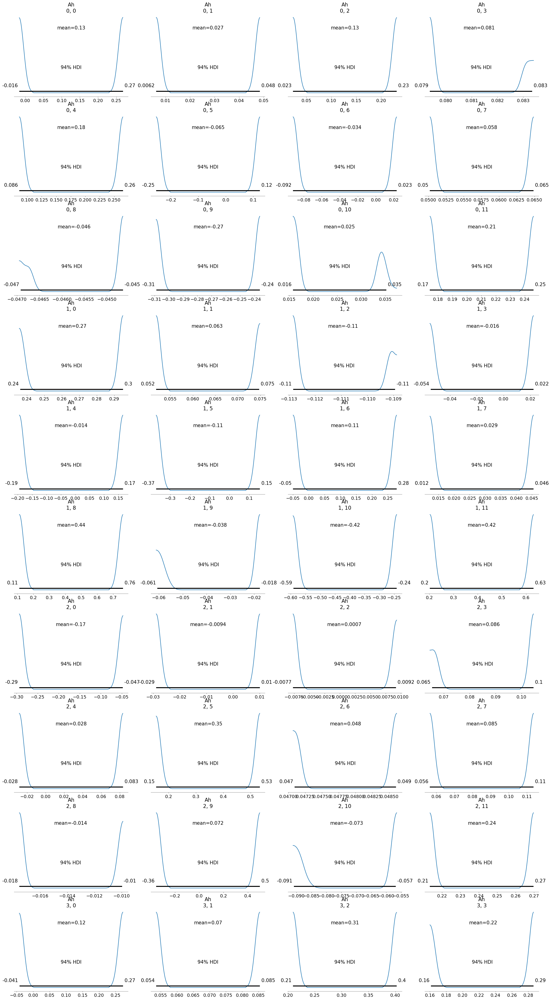

In [4]:
# now use the VAR model with these as priors
inferWithoutPrior = infer_VAR(data=imputed_data, dataS=imputed_MP_data)
inferWithoutPrior.run_inference_xs()

             mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
Ah[0, 0]    0.126  0.142  -0.016    0.268      0.100    0.085       3.0   
Ah[0, 1]    0.027  0.021   0.006    0.048      0.015    0.013       2.0   
Ah[0, 2]    0.127  0.104   0.023    0.231      0.073    0.062       3.0   
Ah[0, 3]    0.081  0.002   0.079    0.083      0.001    0.001       2.0   
Ah[0, 4]    0.176  0.089   0.086    0.265      0.063    0.053       2.0   
...           ...    ...     ...      ...        ...      ...       ...   
Bh[20, 7]  -0.539  0.217  -0.760   -0.319      0.153    0.130       3.0   
Bh[20, 8]  -0.378  0.037  -0.416   -0.341      0.026    0.022       3.0   
Bh[20, 9]   0.367  0.392  -0.026    0.761      0.277    0.235       3.0   
Bh[20, 10] -0.135  0.528  -0.663    0.393      0.373    0.316       3.0   
Bh[20, 11] -0.229  0.009  -0.238   -0.219      0.006    0.005       3.0   

            ess_tail  r_hat  
Ah[0, 0]        33.0   1.89  
Ah[0, 1]        16.0   2.82  
Ah[0, 2] 

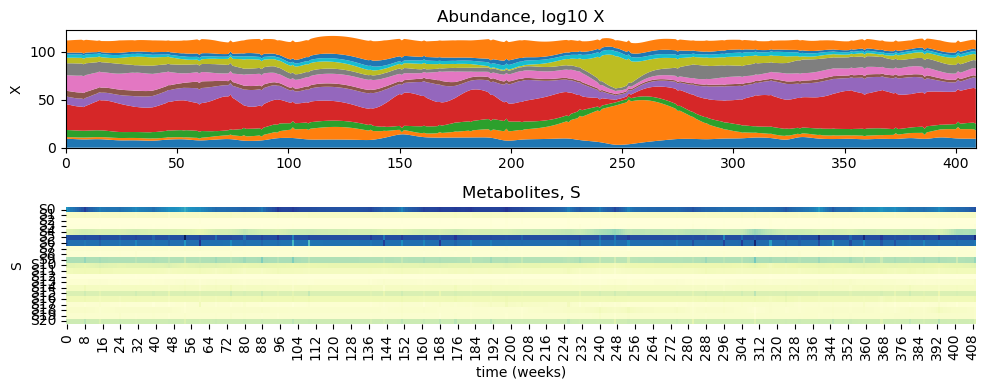

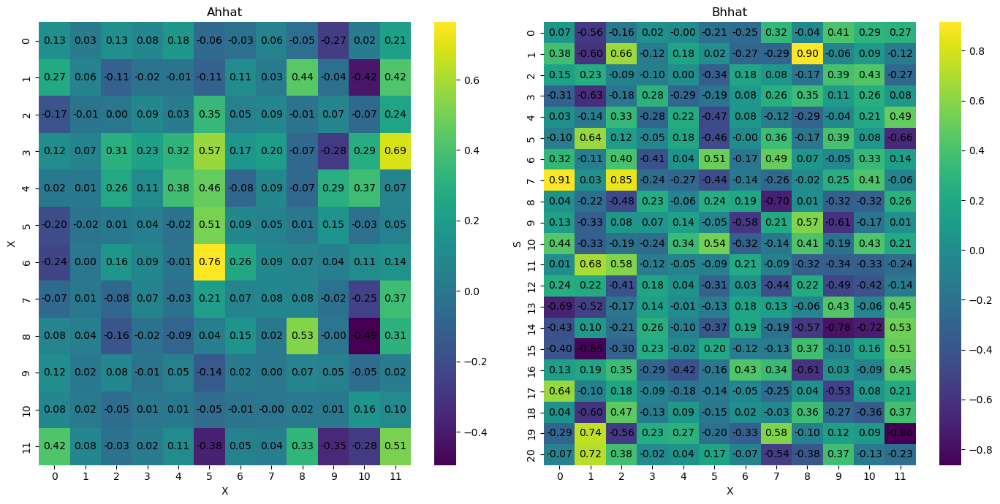

In [5]:
inferWithoutPrior.posterior_analysis()

In [5]:
from statsmodels.tsa.api import VAR

In [6]:
# make VAR model with the imputed data set and statsmodels library
model = VAR(imputed_data)
results = model.fit(maxlags=1, method='ml')

c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [7]:
coefficients = results.params
covariance_matrix = results.sigma_u
intercepts = np.array(results.params.iloc[0])

# remove the first row of the coefficients matrix
coefficients = coefficients[1:]
# transpose the coefficients matrix
coefficients = coefficients.T

In [ ]:
print(coefficients)

In [10]:
inferWithPrior = infer_VAR(data=imputed_data, dataS=imputed_MP_data,
                           coefficients=coefficients, intercepts=intercepts)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [X0h, S0h, Ah, Bh, sigma]


Sampling 2 chains for 1_000 tune and 2_000 draw iterations (2_000 + 4_000 draws total) took 1621 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


             mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
Ah[0, 0]    0.648  0.125   0.523    0.773      0.088    0.075       3.0   
Ah[0, 1]    0.013  0.023  -0.011    0.036      0.016    0.014       2.0   
Ah[0, 2]    0.356  0.091   0.265    0.446      0.064    0.054       2.0   
Ah[0, 3]    0.072  0.020   0.051    0.092      0.014    0.012       3.0   
Ah[0, 4]   -0.063  0.020  -0.083   -0.044      0.014    0.012       2.0   
...           ...    ...     ...      ...        ...      ...       ...   
Bh[20, 7]   0.019  0.253  -0.234    0.273      0.179    0.151       3.0   
Bh[20, 8]  -0.544  0.037  -0.581   -0.507      0.026    0.022       3.0   
Bh[20, 9]   0.172  0.382  -0.210    0.557      0.270    0.228       2.0   
Bh[20, 10]  0.272  0.233   0.039    0.505      0.164    0.139       3.0   
Bh[20, 11] -0.112  0.333  -0.446    0.221      0.235    0.199       3.0   

            ess_tail  r_hat  
Ah[0, 0]        17.0   2.03  
Ah[0, 1]        12.0   2.82  
Ah[0, 2] 

c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\arviz\plots\plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (396) in plot_posterior, generating only 40 plots
  warnings.warn(


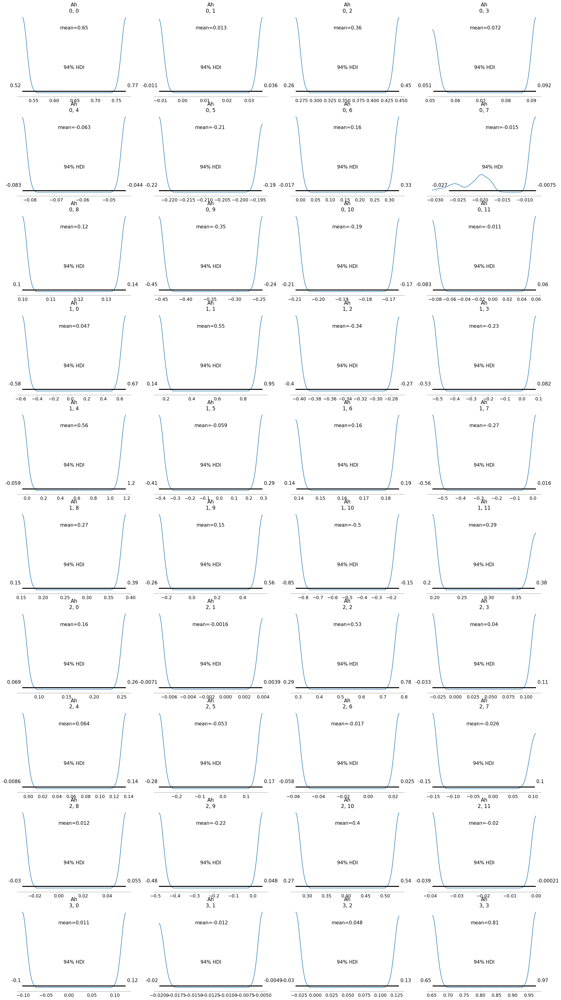

In [11]:
inferWithPrior.run_inference_xs()

             mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
Ah[0, 0]    0.648  0.125   0.523    0.773      0.088    0.075       3.0   
Ah[0, 1]    0.013  0.023  -0.011    0.036      0.016    0.014       2.0   
Ah[0, 2]    0.356  0.091   0.265    0.446      0.064    0.054       2.0   
Ah[0, 3]    0.072  0.020   0.051    0.092      0.014    0.012       3.0   
Ah[0, 4]   -0.063  0.020  -0.083   -0.044      0.014    0.012       2.0   
...           ...    ...     ...      ...        ...      ...       ...   
Bh[20, 7]   0.019  0.253  -0.234    0.273      0.179    0.151       3.0   
Bh[20, 8]  -0.544  0.037  -0.581   -0.507      0.026    0.022       3.0   
Bh[20, 9]   0.172  0.382  -0.210    0.557      0.270    0.228       2.0   
Bh[20, 10]  0.272  0.233   0.039    0.505      0.164    0.139       3.0   
Bh[20, 11] -0.112  0.333  -0.446    0.221      0.235    0.199       3.0   

            ess_tail  r_hat  
Ah[0, 0]        17.0   2.03  
Ah[0, 1]        12.0   2.82  
Ah[0, 2] 

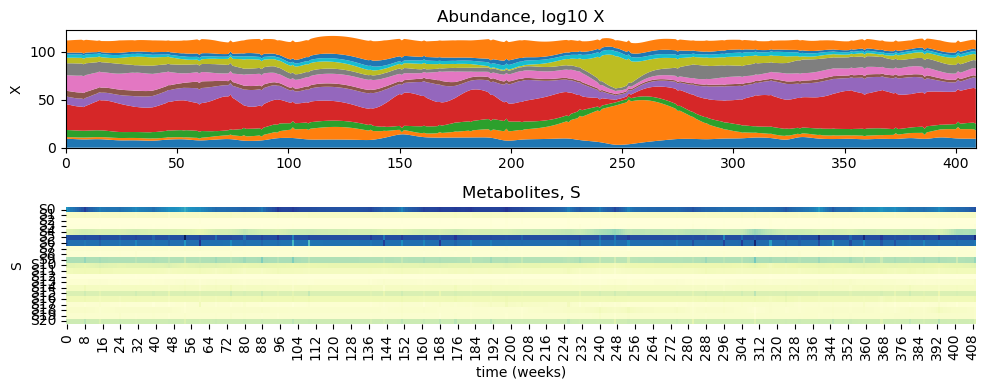

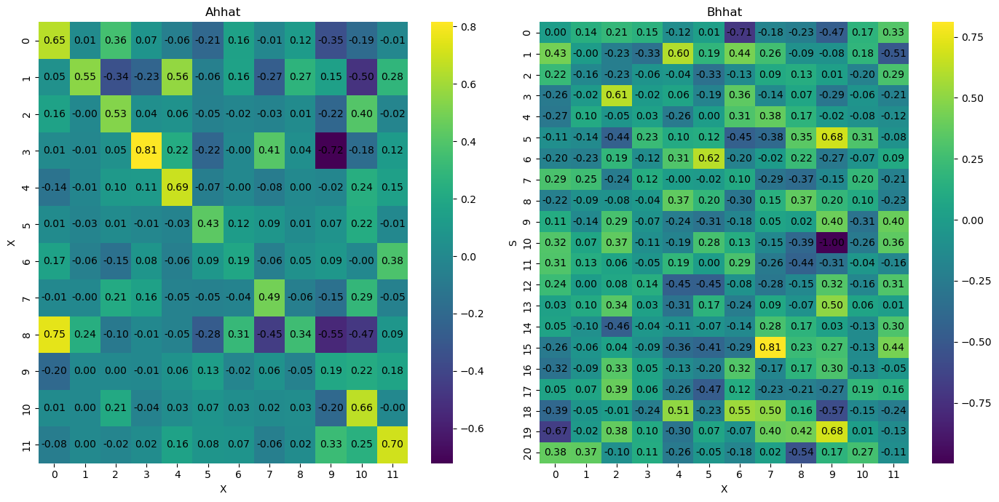

In [12]:
inferWithPrior.posterior_analysis()

In [8]:
inferWithPrior2 = infer_VAR(data=imputed_data, dataS=imputed_MP_data,
                            coefficients=coefficients, intercepts=intercepts)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [c2_A, tau_A, lam_A, Ah, c2_B, tau_B, lam_B, Bh, sigma]


Sampling 4 chains for 2_000 tune and 4_000 draw iterations (8_000 + 16_000 draws total) took 4913 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 1 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


             mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
Ah[0, 0]    0.318  0.361   0.074    0.943      0.180    0.138       4.0   
Ah[0, 1]    0.020  0.027  -0.004    0.065      0.014    0.010       5.0   
Ah[0, 2]    0.025  0.165  -0.256    0.176      0.083    0.063       4.0   
Ah[0, 3]    0.116  0.067  -0.001    0.169      0.034    0.026       4.0   
Ah[0, 4]    0.013  0.023  -0.023    0.039      0.012    0.009       5.0   
...           ...    ...     ...      ...        ...      ...       ...   
Bh[20, 7]  -0.101  0.490  -0.749    0.404      0.245    0.188       4.0   
Bh[20, 8]   0.179  0.168  -0.033    0.349      0.084    0.064       4.0   
Bh[20, 9]   0.000  0.510  -0.713    0.557      0.255    0.195       4.0   
Bh[20, 10]  0.191  0.328  -0.373    0.443      0.164    0.126       4.0   
Bh[20, 11] -0.230  0.217  -0.532    0.084      0.109    0.083       4.0   

            ess_tail  r_hat  
Ah[0, 0]        11.0   3.96  
Ah[0, 1]        23.0   2.96  
Ah[0, 2] 

c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\arviz\plots\plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (396) in plot_posterior, generating only 40 plots
  warnings.warn(


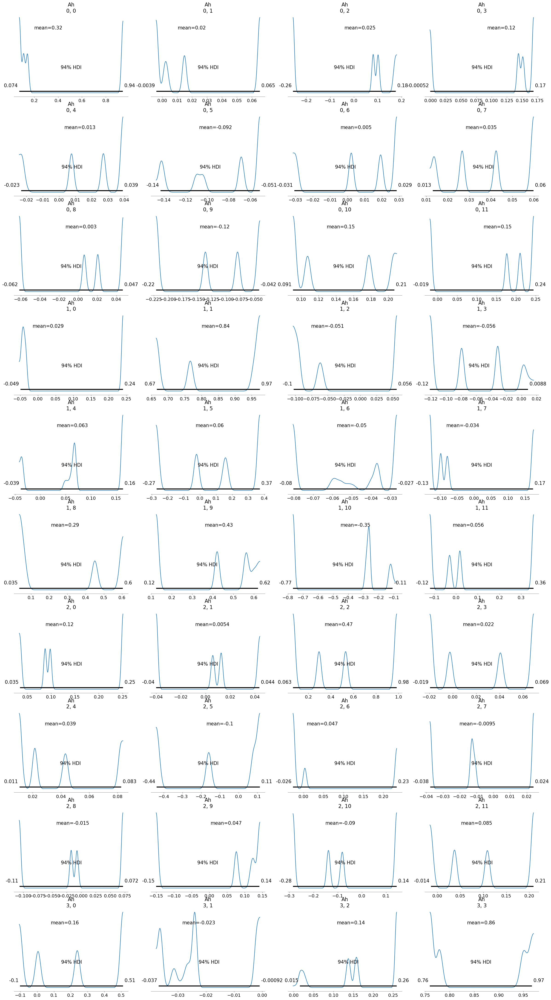

In [9]:
inferWithPrior2.run_inference_large_xs()

             mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
Ah[0, 0]    0.318  0.361   0.074    0.943      0.180    0.138       4.0   
Ah[0, 1]    0.020  0.027  -0.004    0.065      0.014    0.010       5.0   
Ah[0, 2]    0.025  0.165  -0.256    0.176      0.083    0.063       4.0   
Ah[0, 3]    0.116  0.067  -0.001    0.169      0.034    0.026       4.0   
Ah[0, 4]    0.013  0.023  -0.023    0.039      0.012    0.009       5.0   
...           ...    ...     ...      ...        ...      ...       ...   
Bh[20, 7]  -0.101  0.490  -0.749    0.404      0.245    0.188       4.0   
Bh[20, 8]   0.179  0.168  -0.033    0.349      0.084    0.064       4.0   
Bh[20, 9]   0.000  0.510  -0.713    0.557      0.255    0.195       4.0   
Bh[20, 10]  0.191  0.328  -0.373    0.443      0.164    0.126       4.0   
Bh[20, 11] -0.230  0.217  -0.532    0.084      0.109    0.083       4.0   

            ess_tail  r_hat  
Ah[0, 0]        11.0   3.96  
Ah[0, 1]        23.0   2.96  
Ah[0, 2] 

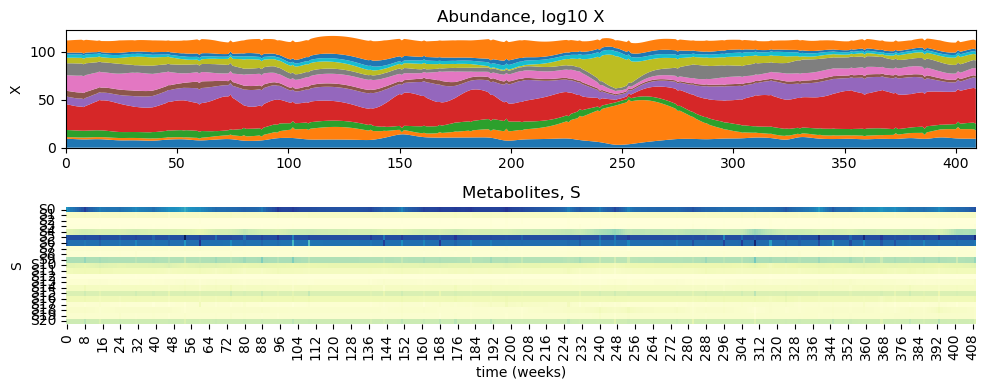

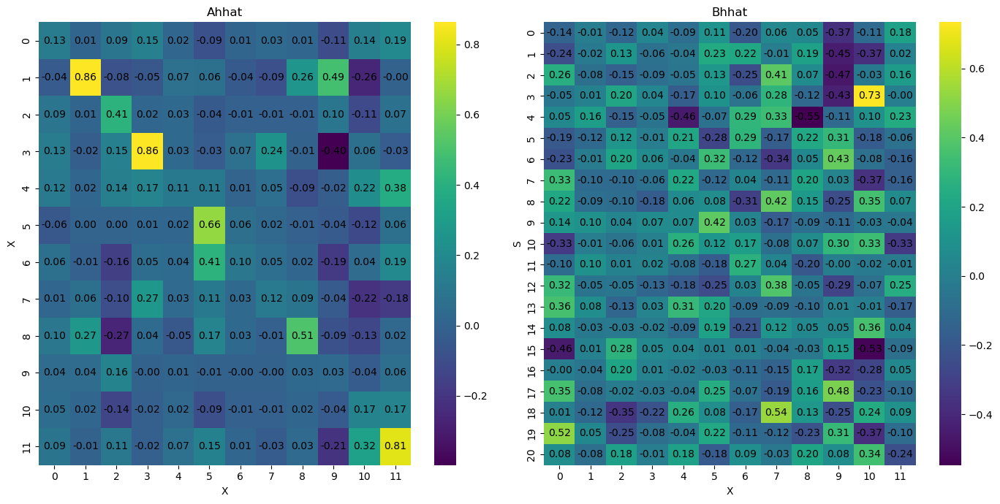

In [10]:
inferWithPrior2.posterior_analysis()

In [11]:
normalVAR = infer_VAR(data=imputed_data)

x0: Shape.0
data[1:, :]: (409, 12)
x0: (12,)
mu: Shape.0
data: (409, 12)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [x0, A, noise_chol]


Sampling 2 chains for 1_000 tune and 2_000 draw iterations (2_000 + 4_000 draws total) took 1194 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
x0[0]      0.566  0.513  -0.323    1.583      0.016    0.012     972.0   
x0[1]      1.655  0.941  -0.161    3.381      0.021    0.016    1924.0   
x0[2]     -0.112  0.421  -0.922    0.662      0.016    0.011     715.0   
x0[3]      1.560  0.916  -0.251    3.168      0.025    0.018    1375.0   
x0[4]      2.400  0.772   0.929    3.823      0.023    0.016    1166.0   
...          ...    ...     ...      ...        ...      ...       ...   
A[11, 7]   0.014  0.007   0.001    0.027      0.000    0.000    1262.0   
A[11, 8]   0.021  0.006   0.010    0.032      0.000    0.000    1107.0   
A[11, 9]  -0.111  0.023  -0.156   -0.069      0.000    0.000    2661.0   
A[11, 10]  0.018  0.021  -0.022    0.058      0.000    0.000    2109.0   
A[11, 11]  1.013  0.010   0.994    1.030      0.000    0.000    1356.0   

           ess_tail  r_hat  
x0[0]        1894.0    1.0  
x0[1]        1895.0    1.0  
x0[2]        1382.0    1

c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\arviz\plots\plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (156) in plot_posterior, generating only 40 plots
  warnings.warn(


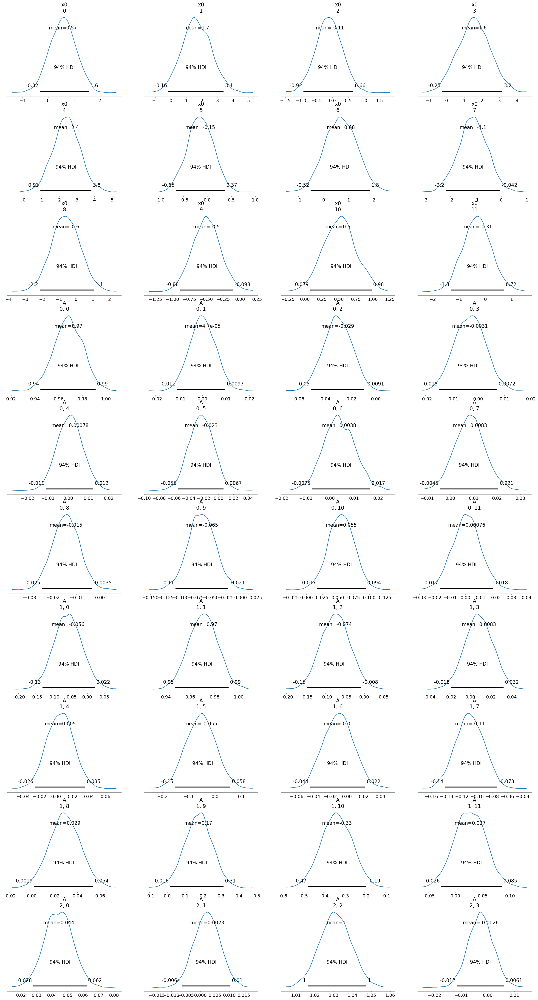

In [12]:
normalVAR.run_inference()

In [16]:
posteriorVAR = az.from_netcdf('model_posterior.nc')

In [45]:
coefficients = posteriorVAR.posterior['A'].values
coefficients_median = pd.DataFrame(np.median(coefficients, axis=(0, 1)))
intercepts = posteriorVAR.posterior['x0'].values
intercepts_median = np.median(intercepts, axis=(0, 1))

In [46]:
inferWithPrior2 = infer_VAR(data=imputed_data, dataS=imputed_MP_data,
                            coefficients=coefficients_median, intercepts=intercepts_median)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [X0h, S0h, Ah, Bh, sigma]


Sampling 2 chains for 1_000 tune and 2_000 draw iterations (2_000 + 4_000 draws total) took 1224 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


             mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
Ah[0, 0]    0.554  0.266   0.287    0.821      0.188    0.159       3.0   
Ah[0, 1]    0.003  0.012  -0.013    0.016      0.009    0.007       2.0   
Ah[0, 2]   -0.100  0.066  -0.165   -0.023      0.046    0.039       2.0   
Ah[0, 3]    0.051  0.023   0.028    0.074      0.016    0.014       3.0   
Ah[0, 4]    0.069  0.056   0.014    0.126      0.040    0.033       3.0   
...           ...    ...     ...      ...        ...      ...       ...   
Bh[20, 7]   0.184  0.212  -0.029    0.396      0.150    0.127       3.0   
Bh[20, 8]  -0.002  0.056  -0.059    0.054      0.040    0.034       2.0   
Bh[20, 9]  -0.558  0.360  -0.922   -0.198      0.254    0.215       2.0   
Bh[20, 10]  0.258  0.444  -0.187    0.702      0.314    0.266       3.0   
Bh[20, 11] -0.267  0.194  -0.461   -0.073      0.137    0.116       3.0   

            ess_tail  r_hat  
Ah[0, 0]        13.0   2.08  
Ah[0, 1]        11.0   2.42  
Ah[0, 2] 

c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\arviz\plots\plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (396) in plot_posterior, generating only 40 plots
  warnings.warn(


OSError: Unable to synchronously create file (unable to truncate a file which is already open)

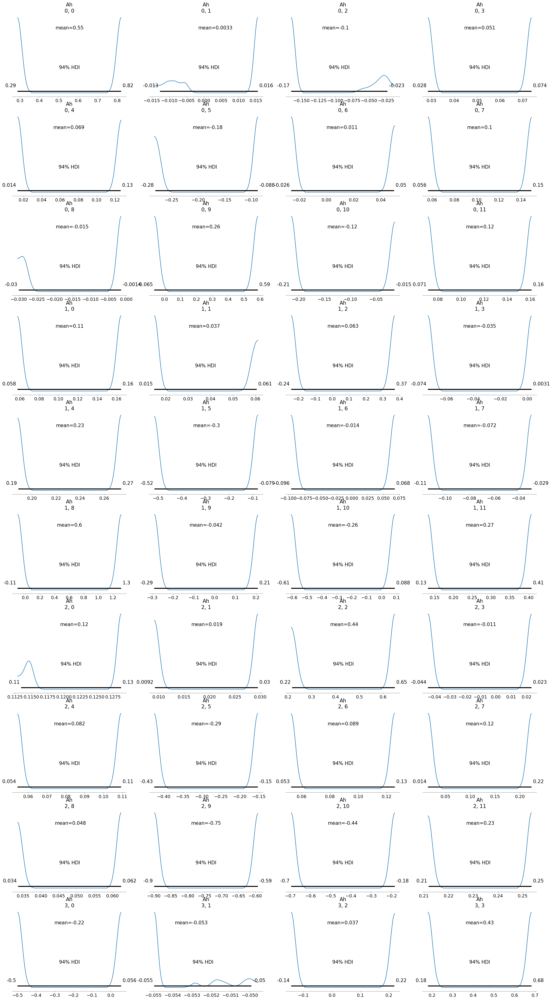

In [47]:
inferWithPrior2.run_inference_xs()

In [48]:
inferWithPrior2.posterior_analysis()

KeyError: 'dataS is not a file in the archive'

So, these inferences show that there is no easy correlation to infer between the species relative abundances and the metabolite concentrations. This could be due to us trying to infer the causal inference between the relative abundance, and not the change in relative abundance of the species. In the next step, we will try to infer the causal relationships between the change in relative abundance of the species and the metabolite concentrations.

In [6]:
# Let's calculate the change in relative abundance for each genus over time from the imputed_data dataset

# Calculate the change in relative abundance for each genus
data_change = imputed_data.diff()

# Make the first row as 0.0 replacing NaN
data_change.iloc[0] = 0.0



Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [X0h, S0h, Ah, Bh, sigma]


Sampling 2 chains for 1_000 tune and 2_000 draw iterations (2_000 + 4_000 draws total) took 1512 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


             mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
Ah[0, 0]    0.450  0.430  -0.014    0.905      0.304    0.257       3.0   
Ah[0, 1]    0.005  0.005  -0.001    0.014      0.003    0.002       4.0   
Ah[0, 2]   -0.113  0.035  -0.175   -0.051      0.019    0.015       4.0   
Ah[0, 3]    0.015  0.008   0.003    0.030      0.004    0.003       4.0   
Ah[0, 4]   -0.005  0.033  -0.067    0.041      0.022    0.019       2.0   
...           ...    ...     ...      ...        ...      ...       ...   
Bh[20, 7]   0.072  0.642  -1.179    1.161      0.281    0.211       5.0   
Bh[20, 8]  -0.061  0.134  -0.324    0.193      0.044    0.032      10.0   
Bh[20, 9]  -0.115  0.850  -1.499    1.713      0.144    0.102      37.0   
Bh[20, 10] -0.329  0.523  -1.303    0.686      0.243    0.184       4.0   
Bh[20, 11]  0.148  0.412  -0.560    0.820      0.197    0.150       5.0   

            ess_tail  r_hat  
Ah[0, 0]        29.0   2.33  
Ah[0, 1]        49.0   1.70  
Ah[0, 2] 

c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\arviz\plots\plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (396) in plot_posterior, generating only 40 plots
  warnings.warn(


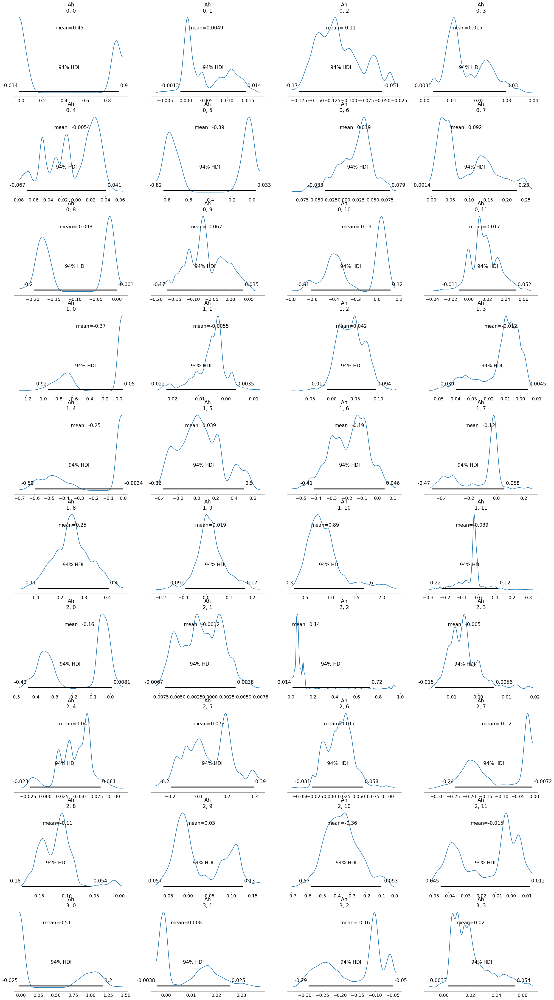

In [12]:
inferChange = infer_VAR(data=data_change, dataS=imputed_MP_data) 
inferChange.run_inference_xs()

             mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
Ah[0, 0]    0.450  0.430  -0.014    0.905      0.304    0.257       3.0   
Ah[0, 1]    0.005  0.005  -0.001    0.014      0.003    0.002       4.0   
Ah[0, 2]   -0.113  0.035  -0.175   -0.051      0.019    0.015       4.0   
Ah[0, 3]    0.015  0.008   0.003    0.030      0.004    0.003       4.0   
Ah[0, 4]   -0.005  0.033  -0.067    0.041      0.022    0.019       2.0   
...           ...    ...     ...      ...        ...      ...       ...   
Bh[20, 7]   0.072  0.642  -1.179    1.161      0.281    0.211       5.0   
Bh[20, 8]  -0.061  0.134  -0.324    0.193      0.044    0.032      10.0   
Bh[20, 9]  -0.115  0.850  -1.499    1.713      0.144    0.102      37.0   
Bh[20, 10] -0.329  0.523  -1.303    0.686      0.243    0.184       4.0   
Bh[20, 11]  0.148  0.412  -0.560    0.820      0.197    0.150       5.0   

            ess_tail  r_hat  
Ah[0, 0]        29.0   2.33  
Ah[0, 1]        49.0   1.70  
Ah[0, 2] 

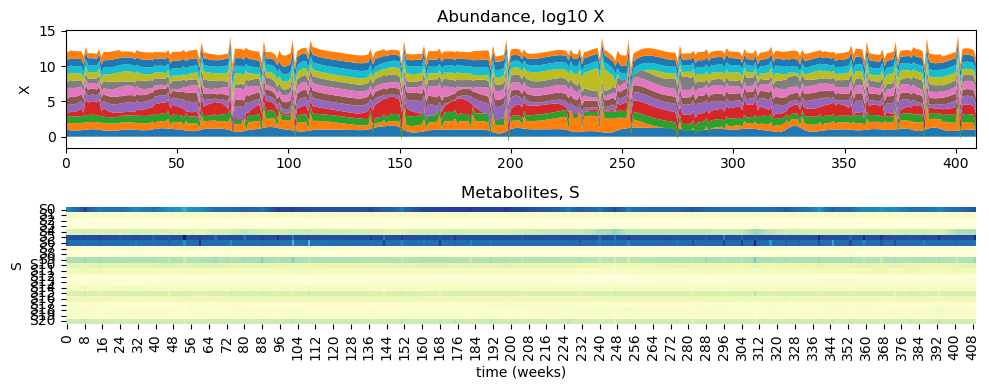

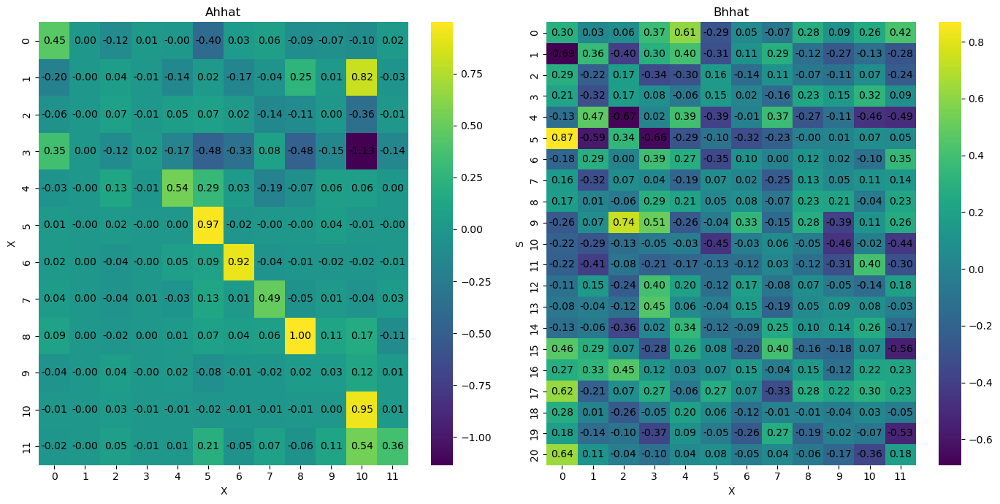

In [13]:
inferChange.posterior_analysis()

In [5]:
from statsmodels.tsa.api import VAR

In [7]:
# make VAR model with the imputed data set and statsmodels library
model = VAR(data_change)
results = model.fit(maxlags=1, method='ml')

c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [8]:
coefficients = results.params
covariance_matrix = results.sigma_u
intercepts = np.array(results.params.iloc[0])

# remove the first row of the coefficients matrix
coefficients = coefficients[1:]
# transpose the coefficients matrix
coefficients = coefficients.T

In [24]:
inferChageWithPrior = infer_VAR(data=data_change, dataS=imputed_MP_data,
                           coefficients=coefficients, intercepts=intercepts)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [X0h, S0h, Ah, Bh, sigma]


Sampling 2 chains for 1_000 tune and 2_000 draw iterations (2_000 + 4_000 draws total) took 1517 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


             mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
Ah[0, 0]    0.873  0.033   0.803    0.934      0.010    0.007      19.0   
Ah[0, 1]    0.007  0.004  -0.001    0.014      0.001    0.001      28.0   
Ah[0, 2]   -0.125  0.025  -0.172   -0.077      0.005    0.004      23.0   
Ah[0, 3]    0.020  0.008   0.006    0.035      0.002    0.001      24.0   
Ah[0, 4]    0.014  0.014  -0.018    0.036      0.004    0.003      16.0   
...           ...    ...     ...      ...        ...      ...       ...   
Bh[20, 7]  -0.099  0.269  -0.553    0.475      0.130    0.099       4.0   
Bh[20, 8]   0.119  0.327  -0.358    0.883      0.192    0.152       3.0   
Bh[20, 9]  -0.341  0.755  -1.742    1.032      0.170    0.122      21.0   
Bh[20, 10]  0.271  0.596  -1.100    1.214      0.229    0.170       6.0   
Bh[20, 11]  0.192  0.429  -0.573    1.069      0.228    0.177       4.0   

            ess_tail  r_hat  
Ah[0, 0]        12.0   1.17  
Ah[0, 1]       144.0   1.02  
Ah[0, 2] 

c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\arviz\plots\plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (396) in plot_posterior, generating only 40 plots
  warnings.warn(


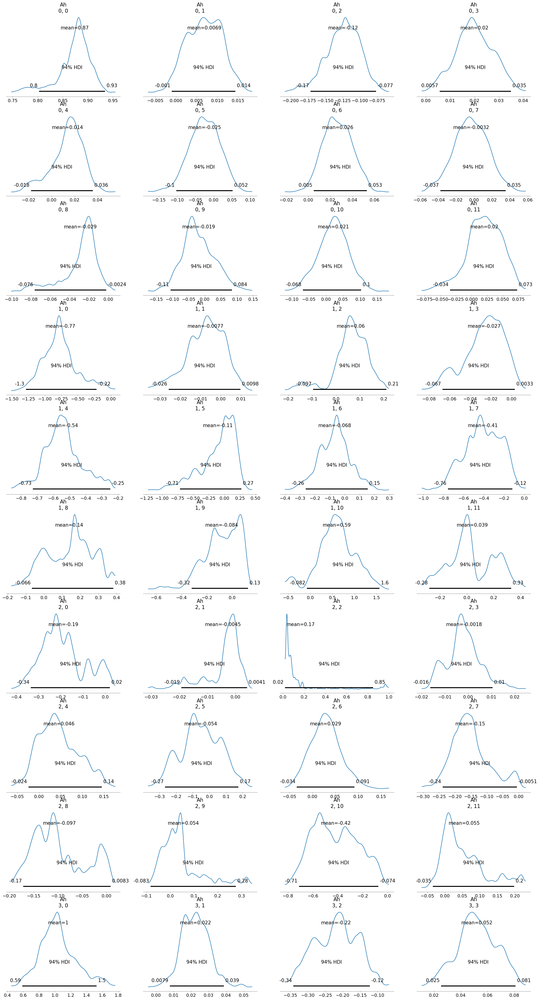

In [25]:
inferChageWithPrior.run_inference_xs()

             mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
Ah[0, 0]    0.873  0.033   0.803    0.934      0.010    0.007      19.0   
Ah[0, 1]    0.007  0.004  -0.001    0.014      0.001    0.001      28.0   
Ah[0, 2]   -0.125  0.025  -0.172   -0.077      0.005    0.004      23.0   
Ah[0, 3]    0.020  0.008   0.006    0.035      0.002    0.001      24.0   
Ah[0, 4]    0.014  0.014  -0.018    0.036      0.004    0.003      16.0   
...           ...    ...     ...      ...        ...      ...       ...   
Bh[20, 7]  -0.099  0.269  -0.553    0.475      0.130    0.099       4.0   
Bh[20, 8]   0.119  0.327  -0.358    0.883      0.192    0.152       3.0   
Bh[20, 9]  -0.341  0.755  -1.742    1.032      0.170    0.122      21.0   
Bh[20, 10]  0.271  0.596  -1.100    1.214      0.229    0.170       6.0   
Bh[20, 11]  0.192  0.429  -0.573    1.069      0.228    0.177       4.0   

            ess_tail  r_hat  
Ah[0, 0]        12.0   1.17  
Ah[0, 1]       144.0   1.02  
Ah[0, 2] 

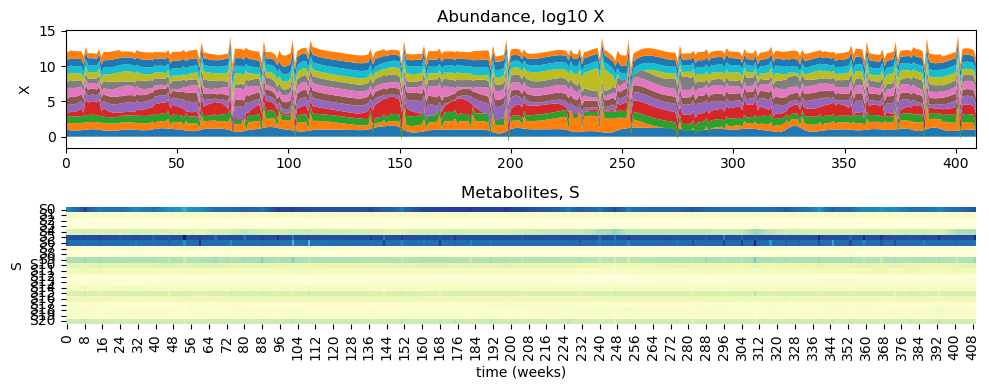

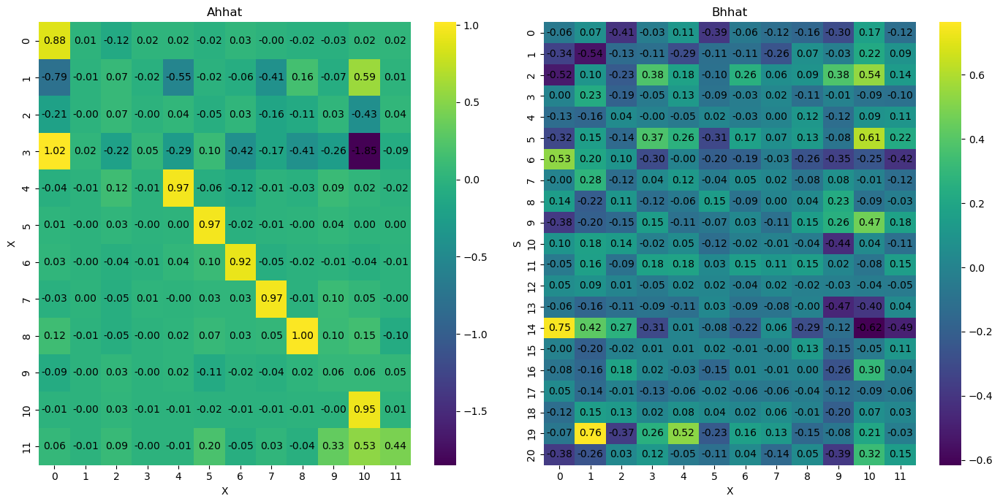

In [26]:
inferChageWithPrior.posterior_analysis()

We can also increase the increase the burn-in and number of samples to get more accurate results.

In [9]:
inferChageWithPrior2 = infer_VAR(data=data_change, dataS=imputed_MP_data,
                           coefficients=coefficients, intercepts=intercepts)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [X0h, S0h, Ah, Bh, sigma]


Sampling 4 chains for 2_000 tune and 4_000 draw iterations (8_000 + 16_000 draws total) took 4642 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 1 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


             mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
Ah[0, 0]    0.781  0.275   0.074    0.949      0.134    0.102       7.0   
Ah[0, 1]    0.008  0.006  -0.002    0.020      0.002    0.001      13.0   
Ah[0, 2]   -0.126  0.096  -0.373   -0.032      0.046    0.035       8.0   
Ah[0, 3]    0.022  0.008   0.008    0.037      0.001    0.001      34.0   
Ah[0, 4]   -0.002  0.051  -0.135    0.039      0.024    0.018       9.0   
...           ...    ...     ...      ...        ...      ...       ...   
Bh[20, 7]  -0.065  0.400  -0.888    0.577      0.151    0.111       7.0   
Bh[20, 8]   0.025  0.262  -0.442    0.507      0.086    0.063      10.0   
Bh[20, 9]  -0.143  1.028  -2.083    1.685      0.164    0.117      39.0   
Bh[20, 10]  0.181  0.690  -1.096    1.506      0.089    0.063      60.0   
Bh[20, 11]  0.061  0.611  -1.126    1.189      0.087    0.062      49.0   

            ess_tail  r_hat  
Ah[0, 0]        16.0   1.52  
Ah[0, 1]        25.0   1.23  
Ah[0, 2] 

c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\arviz\plots\plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (396) in plot_posterior, generating only 40 plots
  warnings.warn(


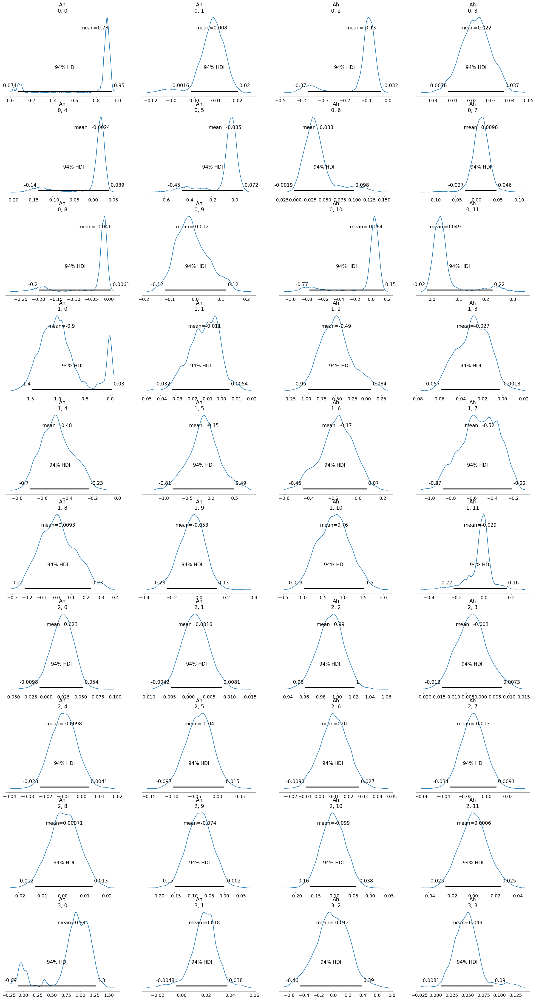

In [10]:
inferChageWithPrior2.run_inference_xs(tune=2000, samples=4000, cores=4)

             mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
Ah[0, 0]    0.781  0.275   0.074    0.949      0.134    0.102       7.0   
Ah[0, 1]    0.008  0.006  -0.002    0.020      0.002    0.001      13.0   
Ah[0, 2]   -0.126  0.096  -0.373   -0.032      0.046    0.035       8.0   
Ah[0, 3]    0.022  0.008   0.008    0.037      0.001    0.001      34.0   
Ah[0, 4]   -0.002  0.051  -0.135    0.039      0.024    0.018       9.0   
...           ...    ...     ...      ...        ...      ...       ...   
Bh[20, 7]  -0.065  0.400  -0.888    0.577      0.151    0.111       7.0   
Bh[20, 8]   0.025  0.262  -0.442    0.507      0.086    0.063      10.0   
Bh[20, 9]  -0.143  1.028  -2.083    1.685      0.164    0.117      39.0   
Bh[20, 10]  0.181  0.690  -1.096    1.506      0.089    0.063      60.0   
Bh[20, 11]  0.061  0.611  -1.126    1.189      0.087    0.062      49.0   

            ess_tail  r_hat  
Ah[0, 0]        16.0   1.52  
Ah[0, 1]        25.0   1.23  
Ah[0, 2] 

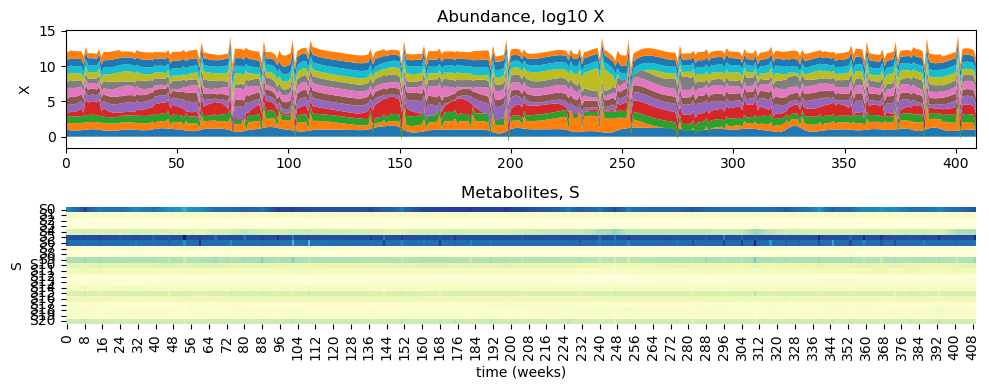

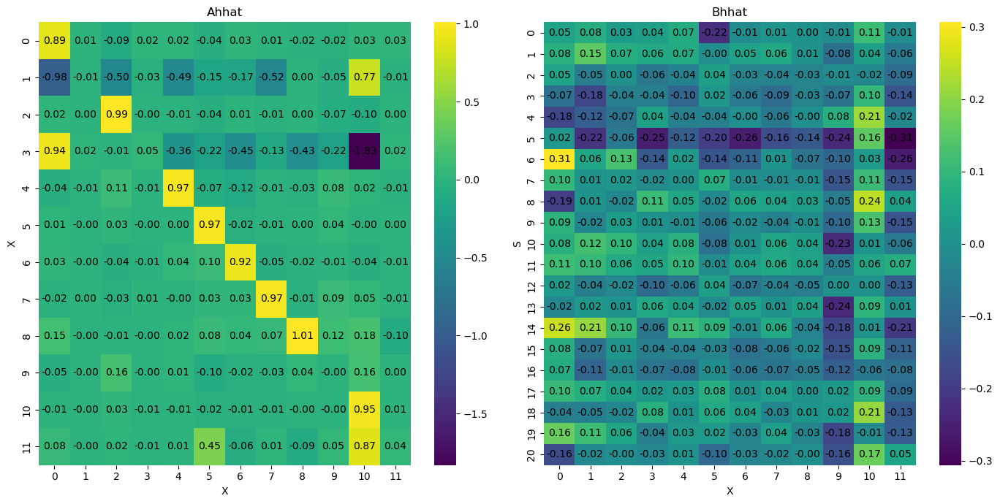

In [11]:
inferChageWithPrior2.posterior_analysis()

In [13]:
inferChageWithPrior3 = infer_VAR(data=data_change, dataS=imputed_MP_data,
                           coefficients=coefficients, intercepts=intercepts)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [c2_A, tau_A, lam_A, Ah, c2_B, tau_B, lam_B, Bh, sigma]


Sampling 4 chains for 2_000 tune and 4_000 draw iterations (8_000 + 16_000 draws total) took 4949 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
There were 4310 divergences after tuning. Increase `target_accept` or reparameterize.
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 1 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


             mean   sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
Ah[0, 0]    0.912  0.0   0.912    0.912        0.0      0.0     298.0   
Ah[0, 1]    0.006  0.0   0.006    0.006        0.0      0.0     169.0   
Ah[0, 2]   -0.084  0.0  -0.084   -0.084        0.0      0.0     512.0   
Ah[0, 3]    0.014  0.0   0.014    0.014        0.0      0.0     211.0   
Ah[0, 4]    0.016  0.0   0.016    0.016        0.0      0.0     157.0   
...           ...  ...     ...      ...        ...      ...       ...   
Bh[20, 7]   0.000  0.0  -0.000    0.000        0.0      0.0     128.0   
Bh[20, 8]   0.000  0.0  -0.000    0.000        0.0      0.0     201.0   
Bh[20, 9]   0.000  0.0  -0.000    0.000        0.0      0.0     363.0   
Bh[20, 10] -0.000  0.0  -0.000    0.000        0.0      0.0     322.0   
Bh[20, 11]  0.000  0.0  -0.000    0.000        0.0      0.0     520.0   

            ess_tail  r_hat  
Ah[0, 0]       185.0   1.15  
Ah[0, 1]        71.0   1.13  
Ah[0, 2]       409.0   1.10  
Ah[

c:\ProgramData\anaconda3\envs\MIMIC\Lib\site-packages\arviz\plots\plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (396) in plot_posterior, generating only 40 plots
  warnings.warn(


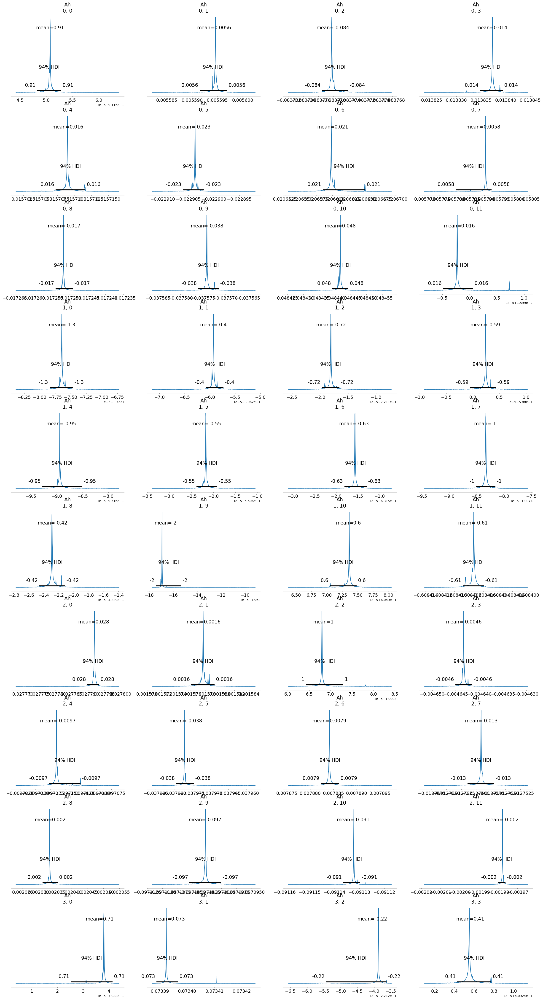

In [14]:
inferChageWithPrior3.run_inference_large_xs()

             mean   sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
Ah[0, 0]    0.912  0.0   0.912    0.912        0.0      0.0     298.0   
Ah[0, 1]    0.006  0.0   0.006    0.006        0.0      0.0     169.0   
Ah[0, 2]   -0.084  0.0  -0.084   -0.084        0.0      0.0     512.0   
Ah[0, 3]    0.014  0.0   0.014    0.014        0.0      0.0     211.0   
Ah[0, 4]    0.016  0.0   0.016    0.016        0.0      0.0     157.0   
...           ...  ...     ...      ...        ...      ...       ...   
Bh[20, 7]   0.000  0.0  -0.000    0.000        0.0      0.0     128.0   
Bh[20, 8]   0.000  0.0  -0.000    0.000        0.0      0.0     201.0   
Bh[20, 9]   0.000  0.0  -0.000    0.000        0.0      0.0     363.0   
Bh[20, 10] -0.000  0.0  -0.000    0.000        0.0      0.0     322.0   
Bh[20, 11]  0.000  0.0  -0.000    0.000        0.0      0.0     520.0   

            ess_tail  r_hat  
Ah[0, 0]       185.0   1.15  
Ah[0, 1]        71.0   1.13  
Ah[0, 2]       409.0   1.10  
Ah[

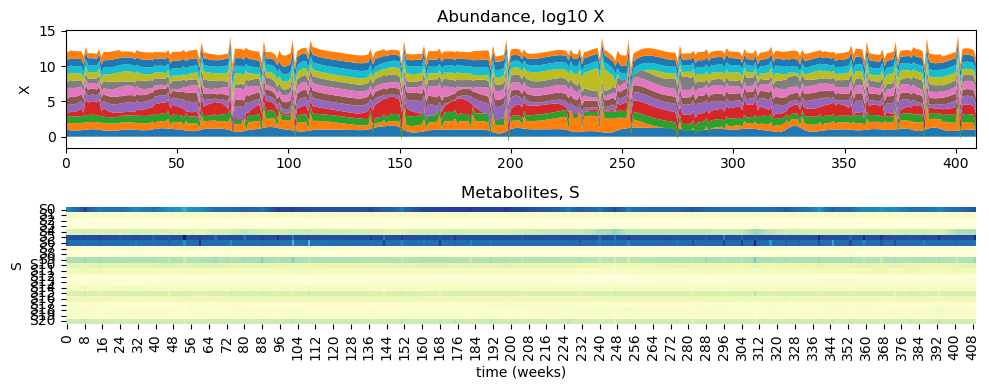

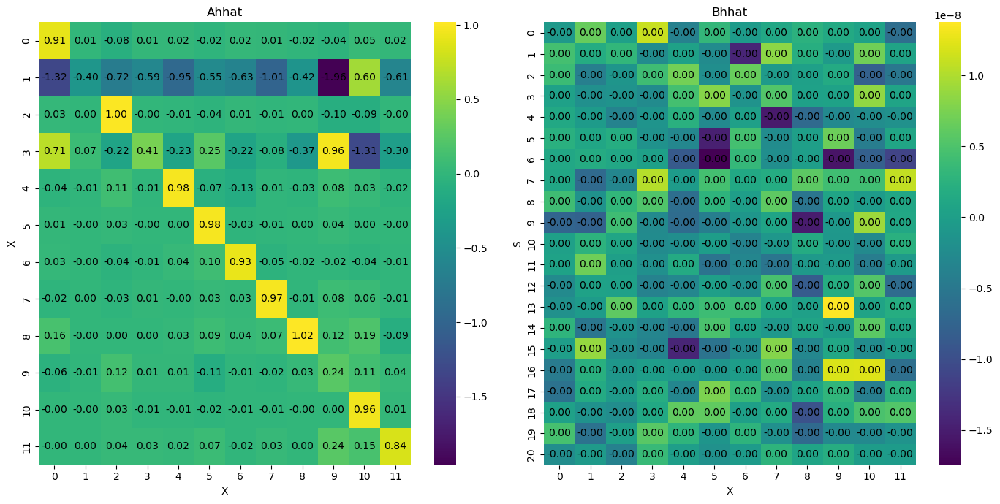

In [15]:
inferChageWithPrior3.posterior_analysis()